In [1]:
using PlotlyJS, Statistics, BenchmarkTools, DataFrames, JSON, StatsBase

In [2]:
mutable struct Agent
    id::Int16
    I::Float64
    E::Float64
    T::Float64
    R::Float64
end

In [169]:
function limit(val::Float64, method::String)

    if method == "trunc"
        if val > 1 return 1.
        elseif val < 0 return 0.
        end
    elseif val >= 1 || val <= 0
        temp::Float64 = 0.
        while temp >= 1 || temp <= 0
            temp = randn() / 5 + .5
        end
        return temp
    end

    return val
        
end

function interact(agent1::Agent, dist::Float64)
    
    if abs(dist) <= agent1.T
        agent1.I = limit(agent1.I + agent1.R * dist, "trunc")
    else
        agent1.I = limit(agent1.I - agent1.R * dist, "trunc")
    end

end

function step(agents::Vector{Agent})
    
    agent1::Agent = rand(agents)
    agent2::Agent = Agent(0,0,0,0,0)
    while true
        agent2 = rand(agents)
        if agent1.id != agent2.id
            break
        end
    end
    
    dist::Float64 = agent2.I - agent1.I
    prob::Float64 = .5^(abs(dist) / agent1.E)

    if rand(Float64) <= prob && dist != 0
        interact(agent1, dist)
    end

end

function runARM(cycles::Int64, agents::Vector{Agent})

    polarization = []

    for s in 1:cycles
        for i in 1:length(agents)
            step(agents)
        end
        push!(polarization, polarity(agents))
    end

    return polarization

end

function polarity(agents::Vector{Agent})
    return var([agent.I for agent in agents])
end

function constantSuite(trials::Int64,cycles::Int64, n_agents::Int64, E::Vector{Float64}, T::Vector{Float64}, R::Vector{Float64})

    results::Vector{Any} = zeros(length(E) * length(T) * length(R))
    lk = ReentrantLock()
    
    Threads.@threads for e in eachindex(E)
        for t in eachindex(T)
            for r in eachindex(R)
                res::Vector{Vector{Float64}} = []
                for tr=1:trials
                    agents = [Agent(i, limit(randn() / 5 + .5, "norm"), E[e], T[t], R[r]) for i=1:n_agents]
                    push!(res, runARM(cycles, agents))
                end
                lock(lk) do
                    index = (e - 1) * length(T) * length(R) + (t - 1) * length(R) + r
                    results[index] = [E[e], T[t], R[r], res]
                end
            end
        end
    end

    return results

end

function avgSeries(results::Vector{Vector{Float64}})

    summing = zeros(length(results[1]))
    for series in results
        summing = summing .+ series
    end
    return summing ./ length(results)
    
end

function getAvgResults(results)
    avg_res = []
    for res in results
        push!(avg_res, [res[1], res[2], res[3], avgSeries(res[4])])
    end
    return avg_res
end

function searchRes(res::Vector, E::Float64, T::Float64, R::Float64)

    paramMatch(row::Vector) = row[1] == E && row[2] == T && row[3] == R
    return filter(paramMatch, res)[1]

end

function compareSeries(series_list::Vector) 

    plot(
        map(x -> scatter(x=1:length(x[4]), y=x[4], name="$(x[1]), $(x[2]), $(x[3])"), series_list),
        Layout(width=600, height = 500)
    )

end

function agentDist(agents::Vector{Agent})

    plot(
        histogram(x=[a.I for a in agents], nbinsx=100),
        Layout(width=600, height=300)
    )

end

function compareHists(agents1::Vector{Agent}, label1::String, agents2::Vector{Agent}, label2::String, cycles::Vector{Int64}) 

    p = make_subplots(
      rows=length(cycles), 
      cols=2, 
      #shared_xaxes=true,
      shared_yaxes=true,
      column_titles=[label1, label2],
      row_titles=[ string("steps: ", c * 100) for c in cycles]
    )
  
    for i in eachindex(cycles)
  
      if i > 1
  
        runARM(cycles[i] - cycles[i-1], agents1)
        runARM(cycles[i] - cycles[i-1], agents2)
  
      end
  
      add_trace!(p, histogram(x=[a.I for a in agents1], nbinsx=100, marker_color="red"), row=i, col=1)
      add_trace!(p, histogram(x=[a.I for a in agents2], nbinsx=100, marker_color="blue"), row=i, col=2)
  
    end
  
    relayout!(
      p, 
      title_text="Comparing $(label1) to $(label2)", 
      showlegend=false, 
      width=500, 
      height=200*length(cycles),
      yaxis_range=[0,100]
      yaxis3_range=[0,100]
      yaxis5_range=[0,100]
    )

    return p
    
  end


compareHists (generic function with 1 method)

In [25]:
const E = [.1]
const T = [i for i in .05:.1:.95]
const R = [.25]

results = constantSuite(2, 2500000, 100, E, T, R);

In [26]:
avg_results = getAvgResults(results);

In [16]:
open("results.json", "r") do f
    global avg_results = JSON.parse(f)
end;

In [117]:
series_list = [
    searchRes(avg_results, .1, .05, .25), 
    searchRes(avg_results, .1, .15, .25), 
    searchRes(avg_results, .1, .25, .25),
    searchRes(avg_results, .1, .35, .25), 
    searchRes(avg_results, .1, .45, .25), 
    searchRes(avg_results, .1, .55, .25),
    searchRes(avg_results, .1, .65, .25),
    searchRes(avg_results, .1, .75, .25),
    searchRes(avg_results, .1, .85, .25),
    searchRes(avg_results, .1, .95, .25)
]
compareSeries(series_list)

UndefVarError: UndefVarError: avg_results not defined

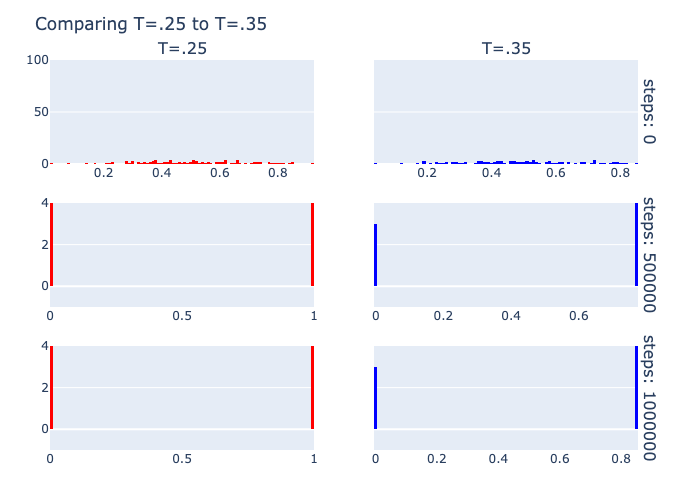

In [170]:
agentsT25 = [Agent(i, limit(randn() / 5 + .5, "norm"), .1, .25, .25) for i=1:100]
agentsT35 = [Agent(i, limit(randn() / 5 + .5, "norm"), .1, .35, .25) for i=1:100]

compareHists(agentsT25, "T=.25", agentsT35, "T=.35", [0, 5000, 10000])

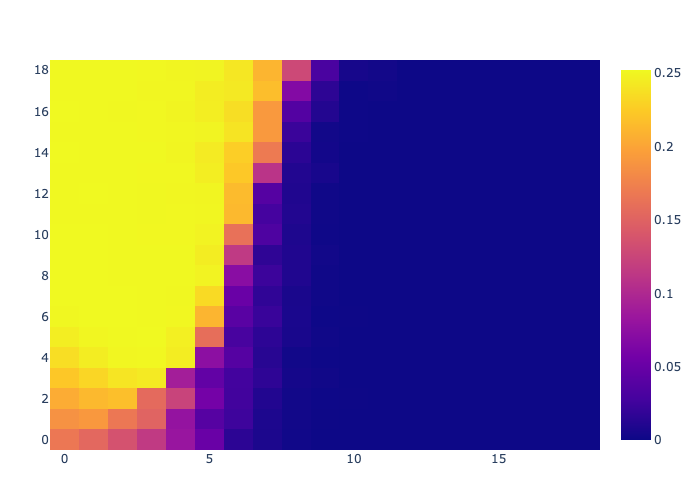

In [7]:
function paramMap(E::Float64, T::Float64, R::Float64, range1::Vector{Float64}, range2::Vector{Float64}, inorder::Bool)

    heat_dat = Array{Float64, 2}(undef, 0, length(range2))
    for i in range2
        row::Vector{Float64} = []
        for j in range1
            if inorder
                if E >= 0 p = searchRes(avg_results, E, i, j)[4][10000]
                elseif T >= 0 p = searchRes(avg_results, i, T, j)[4][10000]
                else p = searchRes(avg_results, i, j, R)[4][10000]
                end
            else
                if E >= 0 p = searchRes(avg_results, E, j, i)[4][10000]
                elseif T >= 0 p = searchRes(avg_results, j, T, i)[4][10000]
                else p = searchRes(avg_results, j, i, R)[4][10000]
                end
            end
            push!(row, p)
        end
        heat_dat = vcat(heat_dat, reshape(row, 1, length(row)))
    end

    return plot(
        heatmap(z=heat_dat),
        Layout(height = 500, width=550)
    )
end

paramMap(.1, -1., -1., [i for i in .05:.05:.95], [i for i in .05:.05:.95], false)

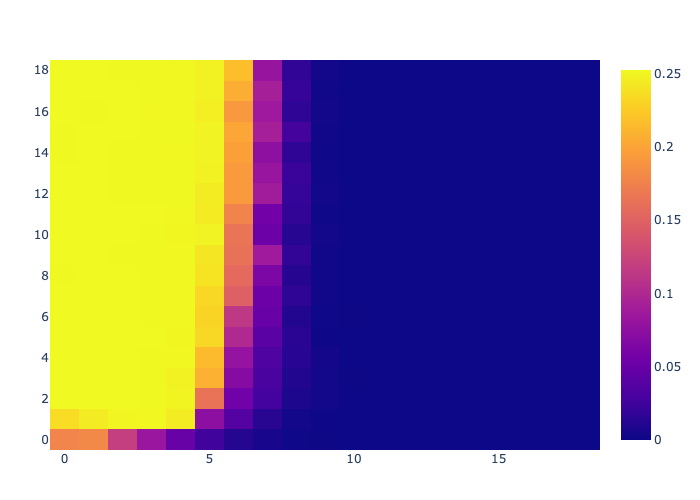

In [9]:
paramMap(-1., -1., .25, [i for i in .05:.05:.95], [i for i in .05:.05:.95], true)

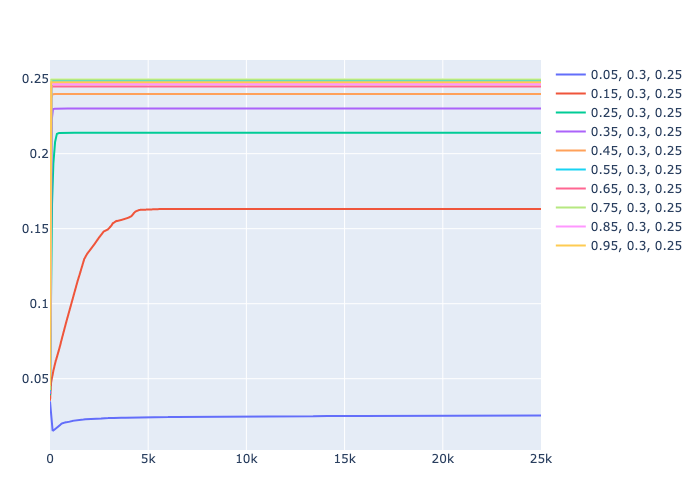

In [11]:
series_list = [
    searchRes(avg_results, .05, .3, .25), 
    searchRes(avg_results, .15, .3, .25), 
    searchRes(avg_results, .25, .3, .25),
    searchRes(avg_results, .35, .3, .25), 
    searchRes(avg_results, .45, .3, .25), 
    searchRes(avg_results, .55, .3, .25),
    searchRes(avg_results, .65, .3, .25),
    searchRes(avg_results, .75, .3, .25),
    searchRes(avg_results, .85, .3, .25),
    searchRes(avg_results, .95, .3, .25)
]
compareSeries(series_list)